In [1]:
from spmf import Spmf
import numpy as np
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import ast
pd.options.plotting.backend = "plotly"
import plotly.express as px
# from chart_studio import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.subplots as sp
from sklearn.feature_extraction.text import CountVectorizer
pd.options.display.max_colwidth = None
pd.set_option('display.max_rows', 70)
from pandas.plotting import table 
#import nltk

import nltk
import seaborn as sns
%matplotlib inline
import random
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import NMF
import pickle

# Find pattern and create Transition Matrix for 0-20% quantile Using N-gram

In [2]:
data_0_20=pd.read_csv("data_0_20_quantile.csv")

In [3]:
data_0_20=data_0_20.merge(data_0_20.groupby(['user_id','session'])\
                                  .agg({'session':'size'})\
                                     .rename(columns={'session':'session_length'})\
                                       .reset_index(),on=['user_id','session'])

In [4]:
data_0_20 = data_0_20.drop(columns=['Unnamed: 0', 'new_session','session_length_y','session_length_x'])
data_0_20 = data_0_20.rename(columns={'sleep_time_x':'sleep time','sleep_time_y':'medium_sleep_time_for_user'})

In [ ]:
data_0_20['medium_sleep_time_for_user'].median() #272.5

In [ ]:
data_0_20['medium_sleep_time_for_user'].describe()

In [ ]:
data_0_20['medium_sleep_time_for_user'].max()  #362.0

In [ ]:
data_0_20.session.nunique()

In [ ]:
data_0_20

## Adding padding to sessions

In [5]:
data_0_20['start']=data_0_20.groupby('user_id').session.shift(1)!=data_0_20.session

In [6]:
data_0_20['end']=data_0_20.groupby('user_id').session.shift(-1)!=data_0_20.session

In [7]:
user_corpus_0_20=data_0_20.groupby(['user_id','session']).package_name.apply(' '.join)

In [8]:
user_corpus_with_start_end_0_20='start '+user_corpus_0_20+ ' end'

# 1-gram

In [9]:
print("Number of sessions:",user_corpus_with_start_end_0_20.shape[0])
print("0.75% of sessions:",user_corpus_with_start_end_0_20.shape[0]/100*0.75)

Number of sessions: 18467691
0.75% of sessions: 138507.6825


In [10]:
print("Number of sessions:",user_corpus_with_start_end_0_20.shape[0])
print("1% of sessions:",user_corpus_with_start_end_0_20.shape[0]/100*1)

Number of sessions: 18467691
1% of sessions: 184676.91


In [11]:
print("Number of sessions:",user_corpus_with_start_end_0_20.shape[0])
print("0.5% of sessions:",user_corpus_with_start_end_0_20.shape[0]/100*0.5)

Number of sessions: 18467691
0.5% of sessions: 92338.455


In [12]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(1,1),lowercase=False)
vectorization=vectorizer.fit_transform(user_corpus_with_start_end_0_20.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]

array(['bbc.mobile.news.uk', 'com.amazon.mShop.android.shopping',
       'com.android.chrome', 'com.android.email', 'com.android.incallui',
       'com.android.phone', 'com.barclays.android.barclaysmobilebanking',
       'com.bskyb.sportnews', 'com.ebay.mobile', 'com.facebook.katana',
       'com.facebook.orca', 'com.google.android.apps.docs',
       'com.google.android.apps.maps',
       'com.google.android.apps.messaging',
       'com.google.android.apps.photos', 'com.google.android.calendar',
       'com.google.android.gm', 'com.google.android.gms',
       'com.google.android.googlequicksearchbox',
       'com.google.android.music', 'com.google.android.youtube',
       'com.grindrapp.android', 'com.instagram.android',
       'com.microsoft.office.outlook', 'com.nianticlabs.pokemongo',
       'com.pinterest', 'com.pof.android', 'com.snapchat.android',
       'com.sony.nfx.app.sfrc', 'com.sonyericsson.album',
       'com.sonyericsson.android.socialphonebook',
       'com.sonyericsson.

In [13]:
frequent_apps_0_20=vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]

In [14]:
len(frequent_apps_0_20)

46

In [ ]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]))

0.75% num 33
1% Number of frequent patterns: 30
10% Number of frequent patterns: 8
0.5% Number of frequent patterns: 44

# 2-gram

In [ ]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(2,2))
vectorization=vectorizer.fit_transform(user_corpus_0_20.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]

In [ ]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]))

1% Number of frequent patterns: 37
0.5% Number of frequent patterns: 79

# 3-gram

In [ ]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(3,3))
vectorization=vectorizer.fit_transform(user_corpus_0_20.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]

In [ ]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]))

1% Number of frequent patterns: 14

# 4-gram

In [ ]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(4,4))
vectorization=vectorizer.fit_transform(user_corpus_0_20.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]

In [ ]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=92338)[1]]))

# Transition Matrix for 0%-20% quantile group 

On the other hand, we need add paddings to be able to recognise if an app occur in the begining of a use sequence, patting is added.

In [38]:
frequent_apps_without_start_end=set(frequent_apps_0_20)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

In [39]:
df_frequent_app_count = data_0_20[data_0_20.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

In [40]:
data_0_20['next_app'] = data_0_20.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

In [41]:
df_next_app_count=data_0_20[data_0_20.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

In [42]:
frequent_apps_without_start=set(frequent_apps_0_20)
frequent_apps_without_start.remove("start")

In [43]:
df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()


In [44]:
df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_0_20.start.sum(),columns=['app_count'],index=['start']))

In [45]:
df_frequent_app_count=df_frequent_app_count.reset_index()

In [46]:
start_numerator=data_0_20[(data_0_20.start)&(data_0_20.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

In [47]:
df_numerator=df_numerator.append(start_numerator)

In [48]:
df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

In [49]:
df_transaction_0_20 = df_numerator.merge(df_frequent_app_count, on='package_name')

In [50]:
df_transaction_0_20['probability'] =df_transaction_0_20.next_count/df_transaction_0_20.app_count

In [51]:
df_transaction_0_20.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [ ]:
df_transaction_0_20.to_csv('df_transaction_0_20.csv',index='False')

Above we have the transition matrix to do the NMF analyse, below we will continuing to visualization the matrix

In [52]:
Transaction_matrix = df_transaction_0_20.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

In [ ]:
Transaction_matrix.to_csv("Transaction_matrix_0_20_quantile_grouped.csv",index='False')

In [ ]:
Transaction_matrix=pd.read_csv("Transaction_matrix_0_20_quantile_grouped.csv", index_col=0)

In [53]:
Transaction_matrix=Transaction_matrix.fillna(0)

In [54]:
Transaction_matrix

next_app,bbc.mobile.news.uk,com.amazon.mShop.android.shopping,com.android.chrome,com.android.email,com.android.incallui,com.android.phone,com.barclays.android.barclaysmobilebanking,com.bskyb.sportnews,com.ebay.mobile,com.facebook.katana,...,com.sonymobile.email,com.spotify.music,com.tinder,com.tumblr,com.twitter.android,com.viber.voip,com.whatsapp,com.yahoo.mobile.client.android.mail,kik.android,uk.co.bbc.android.sportdomestic
package_name,,,,,,,,,,,,,,,,,,,,,
bbc.mobile.news.uk,0.000000,0.003319,0.089944,0.001053,0.002535,0.001358,0.001119,0.003054,0.005626,0.097387,...,0.013844,0.005862,0.003186,0.001119,0.027279,0.001312,0.062417,0.003397,0.001073,0.019736
com.amazon.mShop.android.shopping,0.004297,0.000000,0.096508,0.000453,0.002608,0.001765,0.003154,0.000859,0.029467,0.101885,...,0.021799,0.007391,0.001974,0.001268,0.012559,0.001348,0.075917,0.009196,0.003711,0.001481
com.android.chrome,0.004635,0.005396,0.000000,0.001550,0.004610,0.002450,0.001281,0.001153,0.008405,0.107152,...,0.017814,0.009037,0.003202,0.002792,0.027823,0.001305,0.090739,0.006815,0.005203,0.002073
com.android.email,0.005596,0.001434,0.118194,0.000000,0.010931,0.002485,0.004336,0.001773,0.010635,0.163993,...,0.000035,0.003458,0.002998,0.000808,0.010096,0.000973,0.067469,0.000678,0.000695,0.001260
com.android.incallui,0.001081,0.000720,0.026285,0.002226,0.000000,0.002844,0.000928,0.000590,0.002113,0.073922,...,0.009245,0.004518,0.001044,0.000354,0.005793,0.002896,0.085879,0.004519,0.001990,0.000504
com.android.phone,0.002130,0.001676,0.041767,0.001198,0.008446,0.000000,0.001393,0.000603,0.001709,0.089869,...,0.009170,0.013758,0.002563,0.000992,0.011118,0.001648,0.069035,0.003296,0.002231,0.001174
com.barclays.android.barclaysmobilebanking,0.003530,0.007043,0.054644,0.003074,0.006097,0.003141,0.000000,0.001486,0.007473,0.114736,...,0.015935,0.005860,0.002120,0.000659,0.009061,0.001098,0.074194,0.003344,0.001951,0.001157
com.bskyb.sportnews,0.008212,0.001974,0.064654,0.001301,0.004693,0.001664,0.001573,0.000000,0.004993,0.108754,...,0.012696,0.003765,0.002947,0.001355,0.032704,0.000227,0.083771,0.004975,0.004602,0.011232
com.ebay.mobile,0.005281,0.015076,0.098612,0.002409,0.004554,0.001289,0.002172,0.001120,0.000000,0.127148,...,0.023368,0.003643,0.001682,0.000639,0.010469,0.001513,0.071310,0.010157,0.001158,0.000972


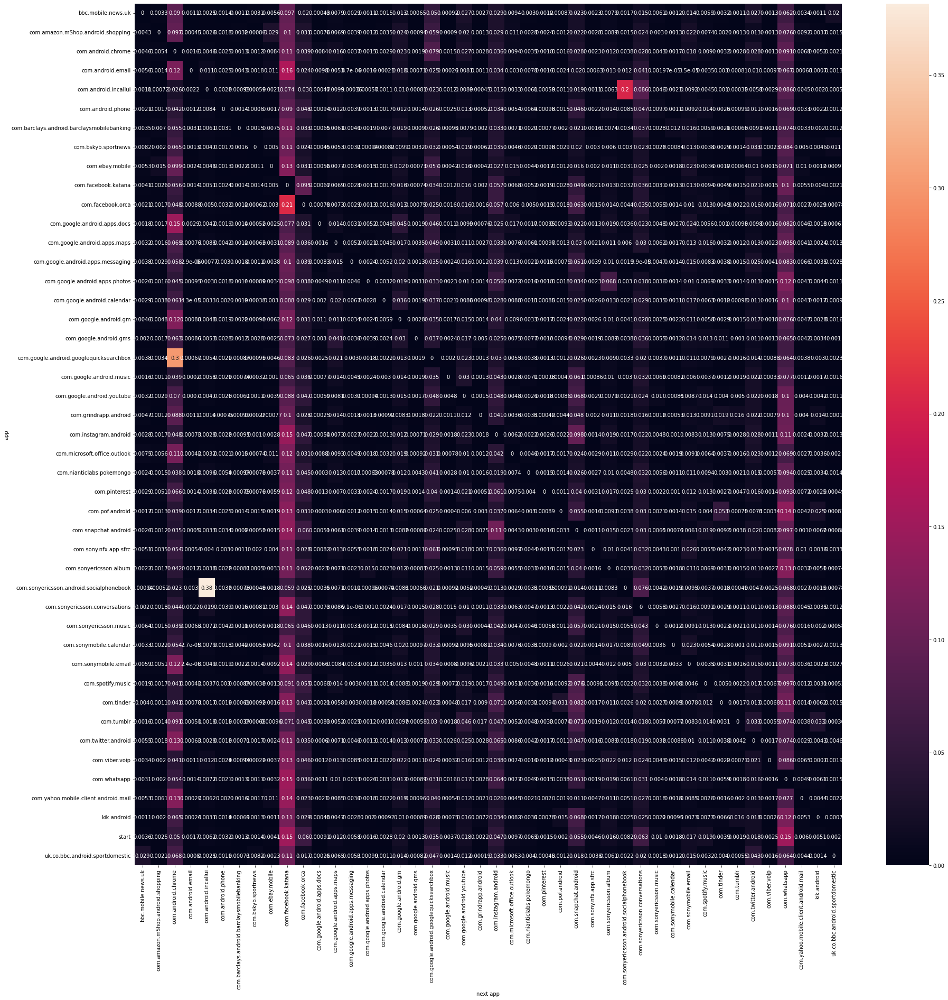

In [56]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(Transaction_matrix, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.show()

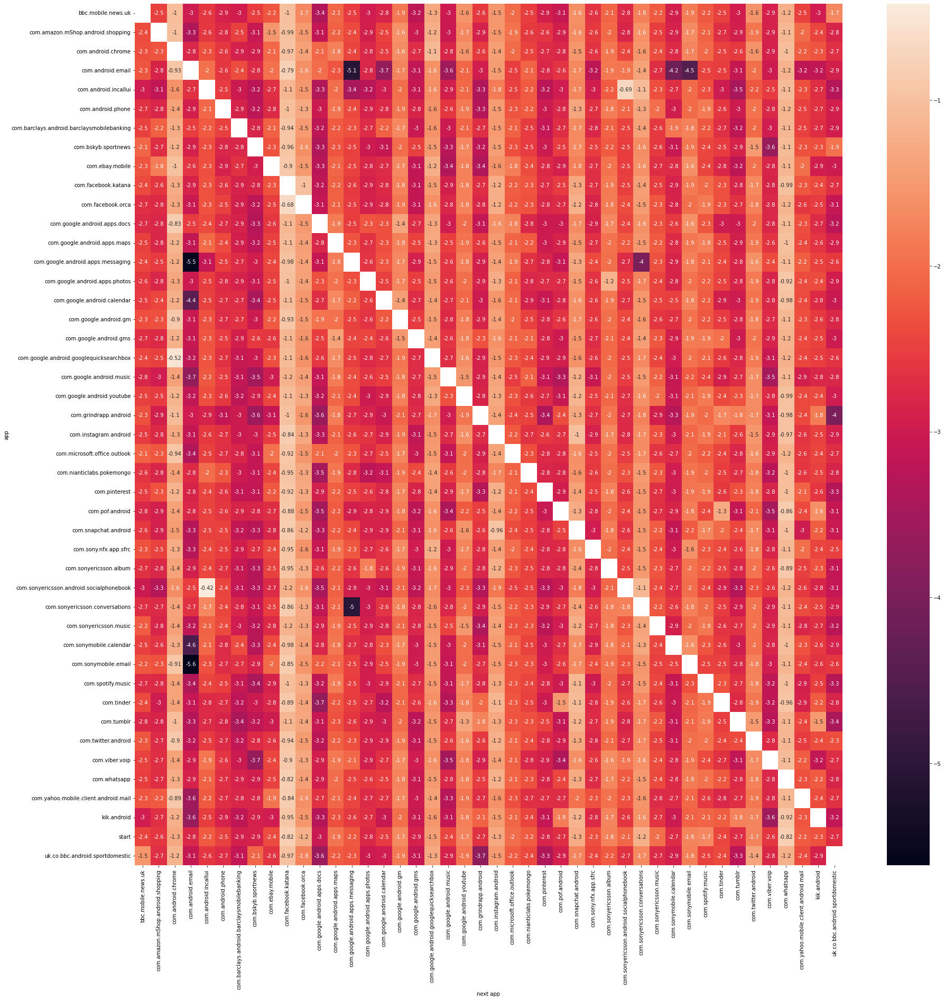

In [57]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(np.log10(Transaction_matrix.replace(0, np.NaN)), annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_20.png')
plt.show()

# Find pattern and create Transition Matrix for 20%-40% quantile Using N-gram

In [20]:
data_20_40=pd.read_csv("data_20_40_quantile.csv")

In [21]:
data_20_40=data_20_40.merge(data_20_40.groupby(['user_id','session'])\
                                  .agg({'session':'size'})\
                                     .rename(columns={'session':'session_length'})\
                                       .reset_index(),on=['user_id','session'])

In [22]:
data_20_40 = data_20_40.drop(columns=['Unnamed: 0', 'new_session','session_length_y','session_length_x'])
data_20_40 = data_20_40.rename(columns={'sleep_time_x':'sleep time','sleep_time_y':'medium_sleep_time_for_user'})

In [23]:
data_20_40['medium_sleep_time_for_user'].describe()

count    5.590568e+07
mean     4.204525e+02
std      3.539711e+01
min      3.625000e+02
25%      3.900000e+02
50%      4.190000e+02
75%      4.510000e+02
max      4.850000e+02
Name: medium_sleep_time_for_user, dtype: float64

In [29]:
data_20_40['medium_sleep_time_for_user'].median()

419.0

In [25]:
data_20_40.session.nunique()

34543

In [30]:
data_20_40

,user_id,package_name,start_time,end_time,time_spend,app_code,sequence_number,sequence_Start_time,sequence_end_time,sleep time,session,medium_sleep_time_for_user
0,3,com.whatsapp,0,3,3,53003,1,0,3,0,0,387.0
1,3,com.whatsapp,5653,5919,266,53003,2,5653,5919,5650,1,387.0
2,3,com.android.incallui,5919,6067,148,7653,3,5919,6067,0,1,387.0
3,3,com.facebook.katana,5969,6009,40,19968,3,5919,6067,0,1,387.0
4,3,com.sonyericsson.conversations,6009,6019,10,45264,3,5919,6067,0,1,387.0
...,...,...,...,...,...,...,...,...,...,...,...,...
55905677,9996,com.google.android.dialer,21860902,21860982,80,23944,20199,21860902,21860982,244,6950,411.0
55905678,9996,com.google.android.dialer,21861723,21862099,376,23944,20201,21862089,21862099,741,6951,411.0
55905679,9996,com.grppl.android.shell.halifax,21862709,21862739,30,24422,20202,21862709,21862739,610,6952,411.0
55905680,9996,com.fsp.android.friendlocator,21862739,21862779,40,21597,20203,21862739,21862779,0,6952,411.0


In [26]:
data_20_40.user_id.nunique()

2003

In [38]:
data_20_40['start']=data_20_40.groupby('user_id').session.shift(1)!=data_20_40.session

In [39]:
data_20_40['end']=data_20_40.groupby('user_id').session.shift(-1)!=data_20_40.session

In [40]:
user_corpus_20_40=data_20_40.groupby(['user_id','session']).package_name.apply(' '.join)

In [41]:
user_corpus_with_start_end_20_40='start '+user_corpus_20_40+ ' end'

## 1-gram

In [42]:
print("Number of sessions:",user_corpus_with_start_end_20_40.shape[0])
print("0.5% of sessions:",user_corpus_with_start_end_20_40.shape[0]/100*0.5)

Number of sessions: 18223271
0.5% of sessions: 91116.355


In [43]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(1,1))
vectorization=vectorizer.fit_transform(user_corpus_with_start_end_20_40.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]

array(['bbc.mobile.news.uk', 'com.amazon.mshop.android.shopping',
       'com.android.chrome', 'com.android.email', 'com.android.incallui',
       'com.android.phone', 'com.ebay.mobile', 'com.facebook.katana',
       'com.facebook.orca', 'com.google.android.apps.docs',
       'com.google.android.apps.maps',
       'com.google.android.apps.messaging',
       'com.google.android.apps.photos', 'com.google.android.calendar',
       'com.google.android.gm', 'com.google.android.gms',
       'com.google.android.googlequicksearchbox',
       'com.google.android.music', 'com.google.android.youtube',
       'com.instagram.android', 'com.microsoft.office.outlook',
       'com.nianticlabs.pokemongo', 'com.pinterest',
       'com.snapchat.android', 'com.sony.nfx.app.sfrc',
       'com.sonyericsson.album',
       'com.sonyericsson.android.socialphonebook',
       'com.sonyericsson.conversations', 'com.sonyericsson.music',
       'com.sonymobile.calendar', 'com.sonymobile.email',
       'com.spotify.

In [44]:
frequent_apps_20_40 =vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]

In [47]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]))

Number of frequent patterns: 39


In [48]:
frequent_apps=vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>91116)[1]]

0.5% Number of frequent patterns: 37

## 2-gram

In [48]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(2,2))
vectorization=vectorizer.fit_transform(user_corpus_with_start_end_20_40.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]

array(['com.android.chrome com.facebook.katana',
       'com.android.chrome com.facebook.orca',
       'com.android.chrome com.google.android.gm',
       'com.android.chrome com.google.android.googlequicksearchbox',
       'com.android.chrome com.google.android.youtube',
       'com.android.chrome com.instagram.android',
       'com.android.chrome com.sonyericsson.conversations',
       'com.android.chrome com.twitter.android',
       'com.android.chrome com.whatsapp', 'com.android.chrome end',
       'com.android.incallui com.sonyericsson.android.socialphonebook',
       'com.android.incallui end',
       'com.facebook.katana com.android.chrome',
       'com.facebook.katana com.facebook.orca',
       'com.facebook.katana com.google.android.gm',
       'com.facebook.katana com.google.android.googlequicksearchbox',
       'com.facebook.katana com.google.android.youtube',
       'com.facebook.katana com.instagram.android',
       'com.facebook.katana com.snapchat.android',
       'com.fa

In [63]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]))

Number of frequent patterns: 59


## 3-gram

In [64]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(3,3))
vectorization=vectorizer.fit_transform(user_corpus_20_40.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]

array(['com.android.chrome com.google.android.googlequicksearchbox com.android.chrome',
       'com.facebook.katana com.android.chrome com.facebook.katana',
       'com.facebook.katana com.facebook.orca com.facebook.katana',
       'com.facebook.katana com.google.android.googlequicksearchbox com.android.chrome',
       'com.facebook.katana com.whatsapp com.facebook.katana',
       'com.facebook.orca com.facebook.katana com.facebook.orca',
       'com.google.android.googlequicksearchbox com.android.chrome com.google.android.googlequicksearchbox',
       'com.whatsapp com.facebook.katana com.whatsapp'], dtype=object)

In [65]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]))

Number of frequent patterns: 8


## 4-gram

In [66]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(4,4))
vectorization=vectorizer.fit_transform(user_corpus_20_40.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]

array([], dtype=object)

In [67]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=91116)[1]]))

Number of frequent patterns: 0


# Transition matrix

In [49]:
frequent_apps_without_start_end=set(frequent_apps_20_40)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

In [50]:
df_frequent_app_count = data_20_40[data_20_40.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

In [51]:
data_20_40['next_app'] = data_20_40.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

In [52]:
df_next_app_count=data_20_40[data_20_40.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

In [53]:
frequent_apps_without_start=set(frequent_apps_20_40)
frequent_apps_without_start.remove("start")

In [54]:
df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()

In [55]:
df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_20_40.start.sum(),columns=['app_count'],index=['start']))

In [56]:
df_frequent_app_count=df_frequent_app_count.reset_index()

In [57]:
start_numerator=data_20_40[(data_20_40.start)&(data_20_40.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

In [58]:
df_numerator=df_numerator.append(start_numerator)

In [59]:
df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

In [60]:
df_transaction_20_40 = df_numerator.merge(df_frequent_app_count, on='package_name')

In [61]:
df_transaction_20_40['probability'] =df_transaction_20_40.next_count/df_transaction_20_40.app_count*100

In [62]:
df_transaction_20_40.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [63]:
df_transaction_20_40.to_csv('df_transaction_20_40.csv',index='False')

In [64]:
Transaction_matrix = df_transaction_20_40.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

In [65]:
Transaction_matrix.to_csv("Transaction_matrix_20_40_quantile_grouped.csv",index='False')

In [66]:
Transaction_matrix=pd.read_csv("Transaction_matrix_20_40_quantile_grouped.csv", index_col=0)

In [67]:
Transaction_matrix=Transaction_matrix.fillna(0)

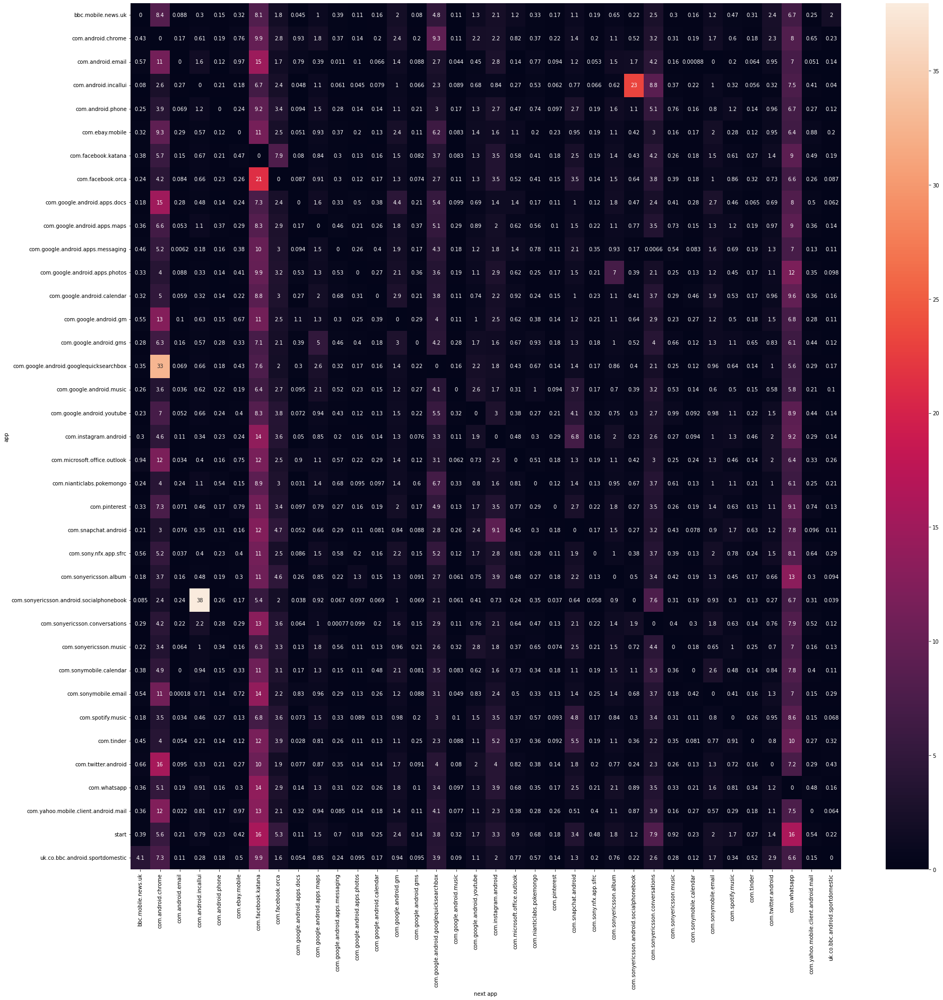

In [68]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(Transaction_matrix, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.show()


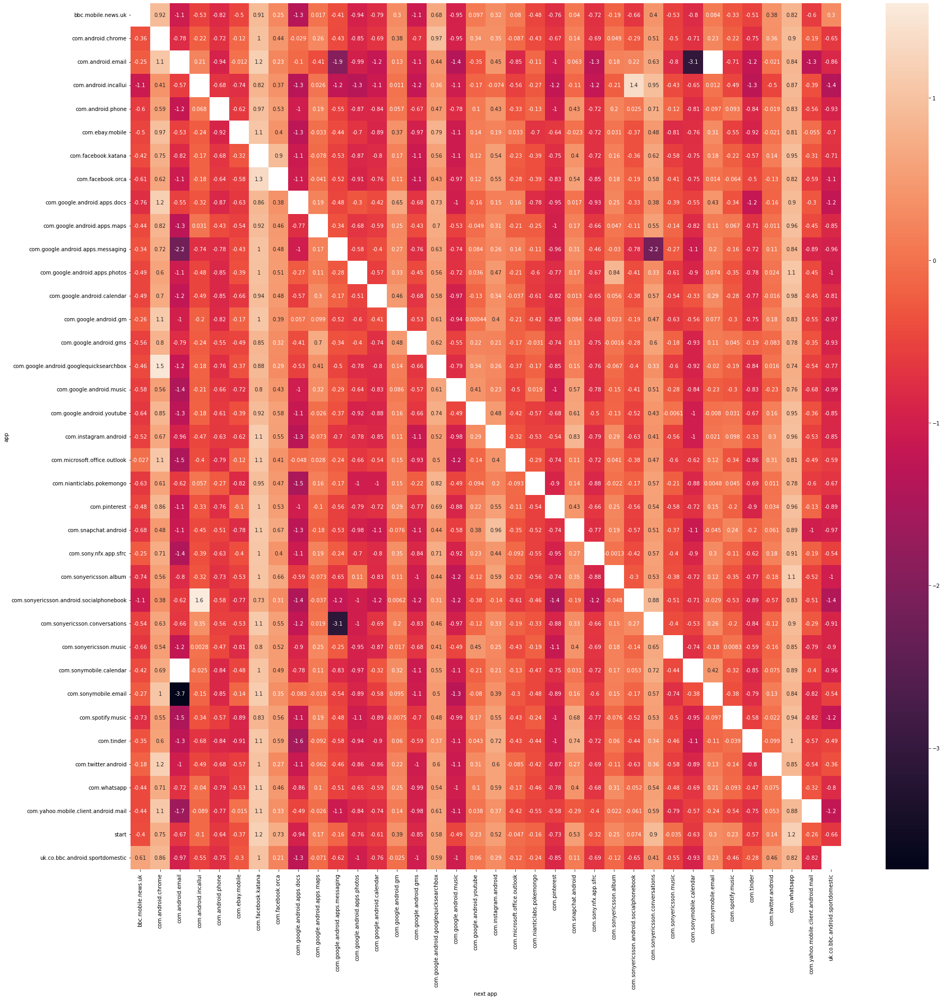

In [69]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(np.log10(Transaction_matrix.replace(0, np.NaN)), annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_20_40.png')
plt.show()

# Find pattern and create Transition Matrix for 40%-60% quantile Using N-gram

In [31]:
data_40_60=pd.read_csv("data_40_60_quantile.csv")

In [32]:
data_40_60=data_40_60.merge(data_40_60.groupby(['user_id','session'])\
                                  .agg({'session':'size'})\
                                     .rename(columns={'session':'session_length'})\
                                       .reset_index(),on=['user_id','session'])

In [33]:
data_40_60 = data_40_60.drop(columns=['Unnamed: 0', 'new_session','session_length_y','session_length_x'])
data_40_60 = data_40_60.rename(columns={'sleep_time_x':'sleep time','sleep_time_y':'medium_sleep_time_for_user'})

In [34]:

data_40_60['medium_sleep_time_for_user'].describe()

count    4.403061e+07
mean     5.552910e+02
std      4.416614e+01
min      4.855000e+02
25%      5.180000e+02
50%      5.510000e+02
75%      5.910000e+02
max      6.390000e+02
Name: medium_sleep_time_for_user, dtype: float64

In [35]:
data_40_60.user_id.nunique()

2009

In [36]:
data_40_60.session.nunique()

26601

In [37]:
data_40_60.medium_sleep_time_for_user.median()

551.0

In [38]:
data_40_60.shape[0]

44030614

In [49]:
data_40_60['start']=data_40_60.groupby('user_id').session.shift(1)!=data_40_60.session

In [50]:
data_40_60['end']=data_40_60.groupby('user_id').session.shift(-1)!=data_40_60.session

In [51]:
user_corpus_40_60=data_40_60.groupby(['user_id','session']).package_name.apply(' '.join)

In [52]:
user_corpus_with_start_end_40_60='start '+user_corpus_40_60+ ' end'

## 1-gram

In [53]:
print("Number of sessions:",user_corpus_with_start_end_40_60.shape[0])
print("0.5% of sessions:",user_corpus_with_start_end_40_60.shape[0]/100*0.5)

Number of sessions: 16504450
0.5% of sessions: 82522.25


In [54]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(1,1))
vectorization=vectorizer.fit_transform(user_corpus_with_start_end_40_60.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]

array(['bbc.mobile.news.uk', 'bbc.mobile.weather',
       'com.amazon.mshop.android.shopping', 'com.android.chrome',
       'com.android.email', 'com.android.incallui', 'com.android.phone',
       'com.ebay.mobile', 'com.facebook.katana', 'com.facebook.orca',
       'com.google.android.apps.docs', 'com.google.android.apps.maps',
       'com.google.android.apps.messaging',
       'com.google.android.apps.photos', 'com.google.android.calendar',
       'com.google.android.gm', 'com.google.android.gms',
       'com.google.android.googlequicksearchbox',
       'com.google.android.youtube', 'com.instagram.android',
       'com.microsoft.office.outlook', 'com.nianticlabs.pokemongo',
       'com.pinterest', 'com.snapchat.android', 'com.sony.nfx.app.sfrc',
       'com.sonyericsson.album',
       'com.sonyericsson.android.socialphonebook',
       'com.sonyericsson.conversations', 'com.sonyericsson.music',
       'com.sonymobile.calendar', 'com.sonymobile.email',
       'com.spotify.music', 'com.

In [55]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]))

Number of frequent patterns: 39


In [56]:
frequent_apps_40_60=vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>82522)[1]]

## 2-gram

In [74]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(2,2))
vectorization=vectorizer.fit_transform(user_corpus_40_60.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]

array(['com.android.chrome com.facebook.katana',
       'com.android.chrome com.facebook.orca',
       'com.android.chrome com.google.android.gm',
       'com.android.chrome com.google.android.googlequicksearchbox',
       'com.android.chrome com.google.android.youtube',
       'com.android.chrome com.sonyericsson.conversations',
       'com.android.chrome com.whatsapp',
       'com.android.incallui com.sonyericsson.android.socialphonebook',
       'com.facebook.katana com.android.chrome',
       'com.facebook.katana com.facebook.orca',
       'com.facebook.katana com.google.android.gm',
       'com.facebook.katana com.google.android.googlequicksearchbox',
       'com.facebook.katana com.instagram.android',
       'com.facebook.katana com.sonyericsson.album',
       'com.facebook.katana com.sonyericsson.conversations',
       'com.facebook.katana com.sonymobile.email',
       'com.facebook.katana com.whatsapp',
       'com.facebook.orca com.facebook.katana',
       'com.facebook.orca c

In [75]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]))

Number of frequent patterns: 44


## 3-gram

In [77]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(3,3))
vectorization=vectorizer.fit_transform(user_corpus_40_60.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]

array(['com.android.chrome com.google.android.googlequicksearchbox com.android.chrome',
       'com.facebook.katana com.facebook.orca com.facebook.katana',
       'com.facebook.katana com.google.android.googlequicksearchbox com.android.chrome',
       'com.facebook.katana com.whatsapp com.facebook.katana',
       'com.google.android.googlequicksearchbox com.android.chrome com.google.android.googlequicksearchbox',
       'com.whatsapp com.facebook.katana com.whatsapp'], dtype=object)

In [79]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]))

Number of frequent patterns: 6


## 4-gram

In [80]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(4,4))
vectorization = vectorizer.fit_transform(user_corpus_40_60.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]

array([], dtype=object)

In [81]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=82522)[1]]))

Number of frequent patterns: 0


## Transition Matrix of 40-60

In [44]:
frequent_apps_without_start_end=set(frequent_apps_40_60)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

In [46]:
df_frequent_app_count = data_40_60[data_40_60.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

In [47]:
data_40_60['next_app'] = data_40_60.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

In [48]:
df_next_app_count=data_40_60[data_40_60.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

In [49]:
frequent_apps_without_start=set(frequent_apps_40_60)
frequent_apps_without_start.remove("start")

In [50]:
df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()

In [51]:
df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_40_60.start.sum(),columns=['app_count'],index=['start']))

In [52]:
df_frequent_app_count=df_frequent_app_count.reset_index()

In [53]:
start_numerator=data_40_60[(data_40_60.start)&(data_40_60.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

In [54]:
df_numerator=df_numerator.append(start_numerator)

In [55]:
df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

In [56]:
df_transaction_40_60 = df_numerator.merge(df_frequent_app_count, on='package_name')

In [57]:
df_transaction_40_60['probability'] =df_transaction_40_60.next_count/df_transaction_40_60.app_count*100

In [58]:
df_transaction_40_60.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [59]:
df_transaction_40_60.to_csv('df_transaction_40_60.csv',index='False')

In [60]:
Transaction_matrix = df_transaction_40_60.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

In [61]:
Transaction_matrix=Transaction_matrix.fillna(0)

In [62]:
Transaction_matrix.to_csv("Transaction_matrix_40_60_quantile_grouped.csv",index='False')

In [63]:
Transaction_matrix=pd.read_csv("Transaction_matrix_40_60_quantile_grouped.csv", index_col=0)

In [64]:
Transaction_matrix=Transaction_matrix.fillna(0)

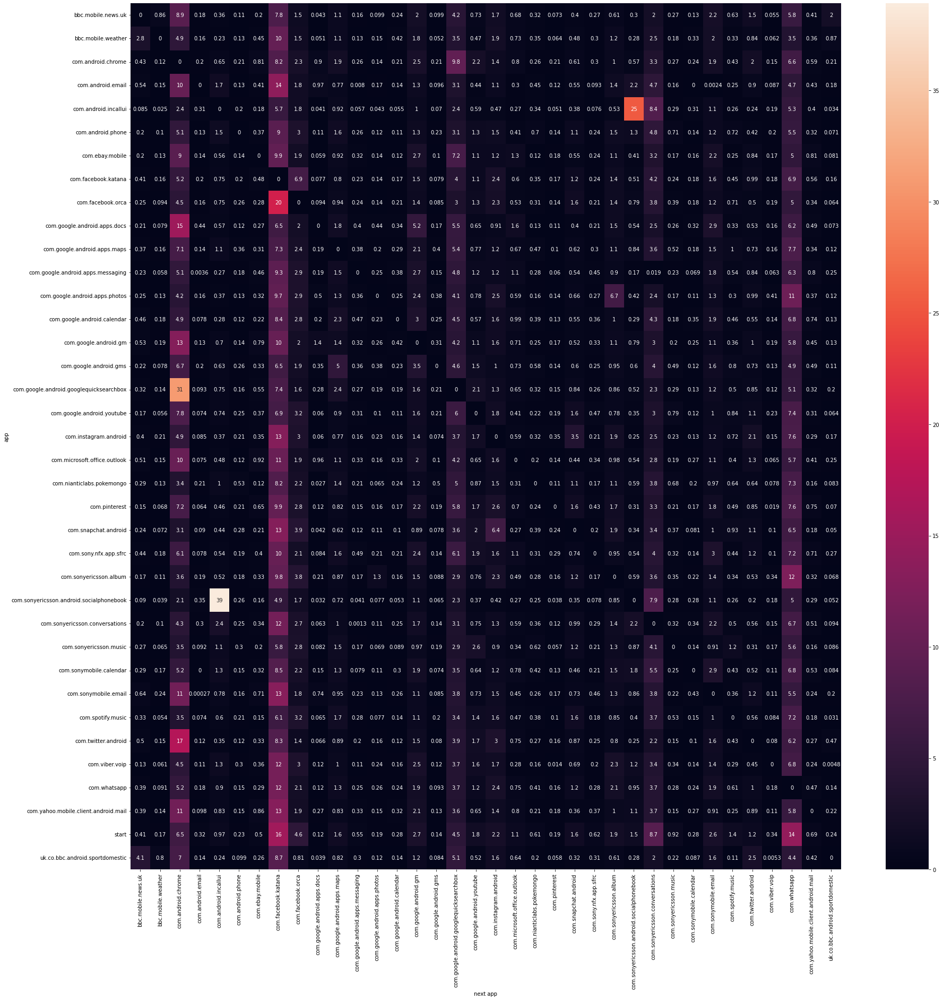

In [65]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(Transaction_matrix, annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_40_60.png')
plt.show()

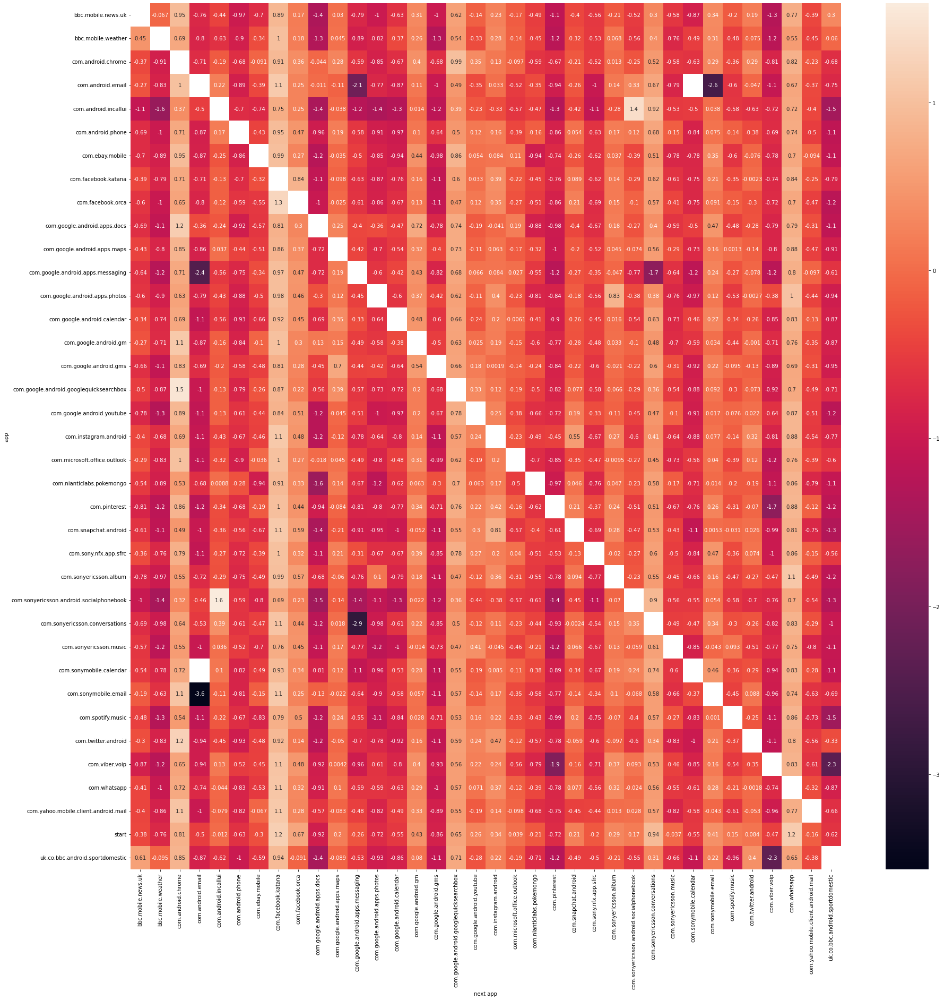

In [66]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(np.log10(Transaction_matrix.replace(0, np.NaN)), annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_40_60.png')
plt.show()

# Find pattern and create Transition Matrix for 60%-80% quantile Using N-gram

In [40]:
data_60_80=pd.read_csv("data_60_80_quantile.csv")

In [41]:
data_60_80=data_60_80.merge(data_60_80.groupby(['user_id','session'])\
                                  .agg({'session':'size'})\
                                     .rename(columns={'session':'session_length'})\
                                       .reset_index(),on=['user_id','session'])

In [42]:
data_60_80 = data_60_80.drop(columns=['Unnamed: 0', 'new_session','session_length_y','session_length_x'])
data_60_80 = data_60_80.rename(columns={'sleep_time_x':'sleep time','sleep_time_y':'medium_sleep_time_for_user'})
data_60_80['medium_sleep_time_for_user'].describe()

count    3.446582e+07
mean     7.503065e+02
std      8.054743e+01
min      6.400000e+02
25%      6.800000e+02
50%      7.370000e+02
75%      8.080000e+02
max      9.340000e+02
Name: medium_sleep_time_for_user, dtype: float64

In [43]:
data_60_80['medium_sleep_time_for_user'].median()

737.0

In [44]:
data_60_80.shape[0]

34465825

In [45]:
data_60_80.session.nunique()

28892

In [46]:
data_60_80.user_id.nunique()

1989

In [ ]:
data_60_80['start']=data_60_80.groupby('user_id').session.shift(1)!=data_60_80.session

In [61]:
user_corpus_60_80=data_60_80.groupby(['user_id','session']).package_name.apply(' '.join)

In [62]:
user_corpus_with_start_end_60_80='start '+user_corpus_60_80+ ' end'

## 1-gram

In [63]:
print("Number of sessions:",user_corpus_with_start_end_60_80.shape[0])
print("0.5% of sessions:",user_corpus_with_start_end_60_80.shape[0]/100*0.5)

Number of sessions: 14402543
0.5% of sessions: 72012.715


In [64]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(1,1))
vectorization=vectorizer.fit_transform(user_corpus_with_start_end_60_80.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]

array(['bbc.mobile.news.uk', 'bbc.mobile.weather',
       'com.amazon.mshop.android.shopping', 'com.android.chrome',
       'com.android.email', 'com.android.incallui', 'com.android.phone',
       'com.ebay.mobile', 'com.facebook.katana', 'com.facebook.orca',
       'com.google.android.apps.docs', 'com.google.android.apps.maps',
       'com.google.android.apps.messaging',
       'com.google.android.apps.photos', 'com.google.android.calendar',
       'com.google.android.gm', 'com.google.android.gms',
       'com.google.android.googlequicksearchbox',
       'com.google.android.youtube', 'com.instagram.android',
       'com.microsoft.office.outlook', 'com.nianticlabs.pokemongo',
       'com.pinterest', 'com.snapchat.android', 'com.sony.nfx.app.sfrc',
       'com.sonyericsson.album',
       'com.sonyericsson.android.socialphonebook',
       'com.sonyericsson.conversations', 'com.sonyericsson.music',
       'com.sonymobile.calendar', 'com.sonymobile.email',
       'com.spotify.music', 'com.

In [65]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]))

Number of frequent patterns: 38


In [66]:
frequent_apps_60_80=vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>72012)[1]]

In [17]:
frequent_apps_60_80

array(['bbc.mobile.news.uk', 'bbc.mobile.weather',
       'com.amazon.mshop.android.shopping', 'com.android.chrome',
       'com.android.email', 'com.android.incallui', 'com.android.phone',
       'com.ebay.mobile', 'com.facebook.katana', 'com.facebook.orca',
       'com.google.android.apps.docs', 'com.google.android.apps.maps',
       'com.google.android.apps.messaging',
       'com.google.android.apps.photos', 'com.google.android.calendar',
       'com.google.android.gm', 'com.google.android.gms',
       'com.google.android.googlequicksearchbox',
       'com.google.android.youtube', 'com.instagram.android',
       'com.microsoft.office.outlook', 'com.nianticlabs.pokemongo',
       'com.pinterest', 'com.snapchat.android', 'com.sony.nfx.app.sfrc',
       'com.sonyericsson.album',
       'com.sonyericsson.android.socialphonebook',
       'com.sonyericsson.conversations', 'com.sonyericsson.music',
       'com.sonymobile.calendar', 'com.sonymobile.email',
       'com.spotify.music', 'com.

## 2-gram

In [8]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(2,2))
vectorization=vectorizer.fit_transform(user_corpus_60_80.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]

array(['com.android.chrome com.facebook.katana',
       'com.android.chrome com.google.android.gm',
       'com.android.chrome com.google.android.googlequicksearchbox',
       'com.android.chrome com.sonyericsson.conversations',
       'com.android.chrome com.whatsapp',
       'com.android.incallui com.sonyericsson.android.socialphonebook',
       'com.facebook.katana com.android.chrome',
       'com.facebook.katana com.facebook.orca',
       'com.facebook.katana com.google.android.googlequicksearchbox',
       'com.facebook.katana com.sonyericsson.conversations',
       'com.facebook.katana com.sonymobile.email',
       'com.facebook.katana com.whatsapp',
       'com.facebook.orca com.facebook.katana',
       'com.google.android.gm com.android.chrome',
       'com.google.android.gm com.facebook.katana',
       'com.google.android.googlequicksearchbox com.android.chrome',
       'com.google.android.googlequicksearchbox com.facebook.katana',
       'com.google.android.googlequicksearchb

In [9]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]))

Number of frequent patterns: 32


## 3-gram

In [10]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(3,3))
vectorization=vectorizer.fit_transform(user_corpus_60_80.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]

array(['com.android.chrome com.google.android.googlequicksearchbox com.android.chrome',
       'com.facebook.katana com.google.android.googlequicksearchbox com.android.chrome',
       'com.google.android.googlequicksearchbox com.android.chrome com.google.android.googlequicksearchbox'],
      dtype=object)

In [11]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]))

Number of frequent patterns: 3


## 4-gram

In [12]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(4,4))
vectorization=vectorizer.fit_transform(user_corpus_60_80.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]

array([], dtype=object)

In [13]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=72012)[1]]))

Number of frequent patterns: 0


# Transition matrix

In [18]:
frequent_apps_without_start_end=set(frequent_apps_60_80)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

In [19]:
df_frequent_app_count = data_60_80[data_60_80.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

In [20]:
data_60_80['next_app'] = data_60_80.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

In [21]:
df_next_app_count=data_60_80[data_60_80.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

In [22]:
frequent_apps_without_start=set(frequent_apps_60_80)
frequent_apps_without_start.remove("start")

In [23]:
df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start)].reset_index()

In [24]:
df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_60_80.start.sum(),columns=['app_count'],index=['start']))

In [25]:
df_frequent_app_count=df_frequent_app_count.reset_index()

In [26]:
start_numerator=data_60_80[(data_60_80.start)&(data_60_80.package_name.isin(frequent_apps_without_start))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

In [27]:
df_numerator=df_numerator.append(start_numerator)

In [28]:
df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

In [29]:
df_transaction_60_80 = df_numerator.merge(df_frequent_app_count, on='package_name')

In [30]:
df_transaction_60_80['probability'] =df_transaction_60_80.next_count/df_transaction_60_80.app_count*100

In [31]:
df_transaction_60_80.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [32]:
df_transaction_60_80.to_csv('df_transaction_60_80.csv',index='False')

In [33]:
Transaction_matrix = df_transaction_60_80.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

In [34]:
Transaction_matrix=Transaction_matrix.fillna(0)

In [35]:
Transaction_matrix.to_csv("Transaction_matrix_60_80_quantile_grouped.csv",index='False')

In [36]:
Transaction_matrix=pd.read_csv("Transaction_matrix_60_80_quantile_grouped.csv", index_col=0)

In [37]:
Transaction_matrix=Transaction_matrix.fillna(0)

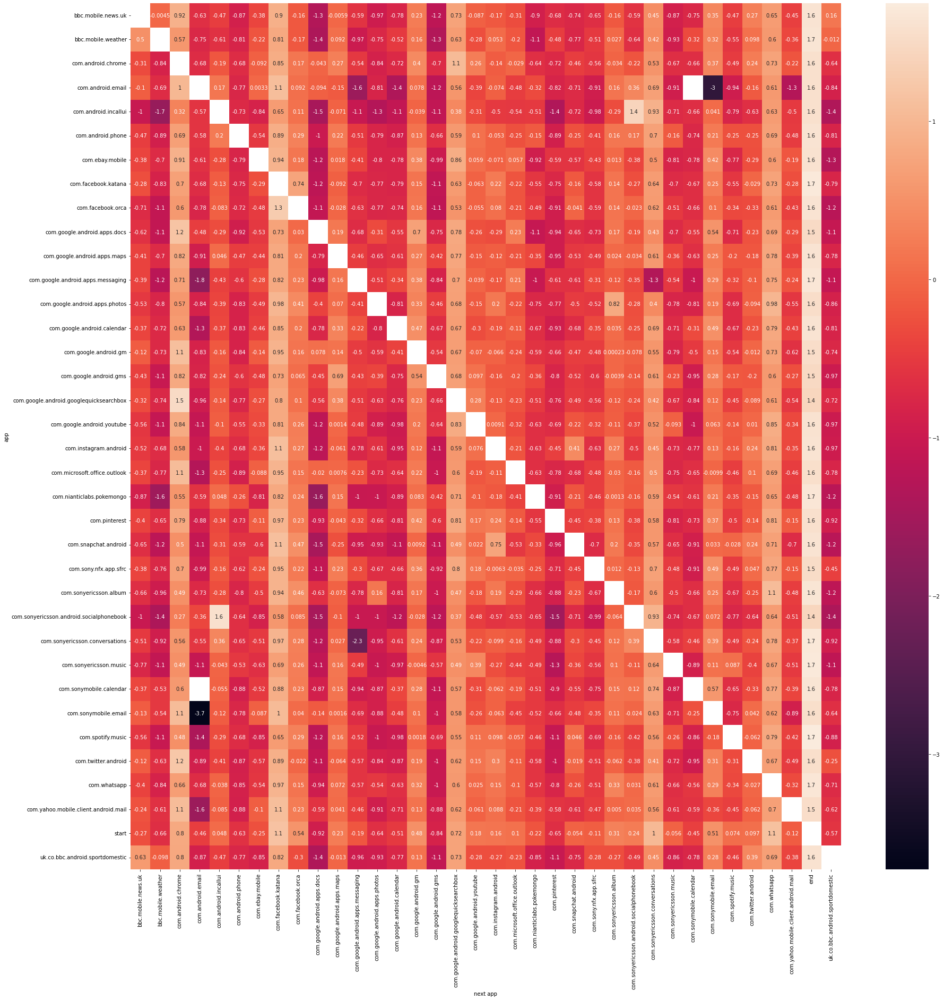

In [38]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(np.log10(Transaction_matrix.replace(0, np.NaN)), annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_60_80.png')
plt.show()

# Find pattern and create Transition Matrix for 80%-100% quantile Using N-gram

In [47]:
data_80_100=pd.read_csv("data_80_100_quantile.csv")

In [48]:
data_80_100=data_80_100.merge(data_80_100.groupby(['user_id','session'])\
                                  .agg({'session':'size'})\
                                     .rename(columns={'session':'session_length'})\
                                       .reset_index(),on=['user_id','session'])

In [49]:
data_80_100 = data_80_100.drop(columns=['Unnamed: 0', 'new_session','session_length_y','session_length_x'])
data_80_100 = data_80_100.rename(columns={'sleep_time_x':'sleep time','sleep_time_y':'medium_sleep_time_for_user'})
data_80_100['medium_sleep_time_for_user'].describe()

count    1.898684e+07
mean     1.434528e+03
std      7.758408e+02
min      9.350000e+02
25%      1.052000e+03
50%      1.219500e+03
75%      1.546500e+03
max      3.246200e+04
Name: medium_sleep_time_for_user, dtype: float64

In [50]:
data_80_100['medium_sleep_time_for_user'].median()

1219.5

In [51]:
data_80_100.shape[0]

18986840

In [52]:
data_80_100.session.nunique()

16388

In [53]:
data_80_100.user_id.nunique()

1999

In [70]:
data_80_100['start']=data_80_100.groupby('user_id').session.shift(1)!=data_80_100.session

In [71]:
data_80_100['end']=data_80_100.groupby('user_id').session.shift(-1)!=data_80_100.session

In [72]:
user_corpus_80_100=data_80_100.groupby(['user_id','session']).package_name.apply(' '.join)

In [73]:
user_corpus_with_start_end_80_100='start '+user_corpus_80_100+ ' end'

## 1-gram

In [74]:
print("Number of sessions:",user_corpus_with_start_end_80_100.shape[0])
print("0.5% of sessions:",user_corpus_with_start_end_80_100.shape[0]/100*0.5)

Number of sessions: 9177167
0.5% of sessions: 45885.835


In [75]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(1,1))
vectorization=vectorizer.fit_transform(user_corpus_with_start_end_80_100.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]

array(['bbc.mobile.news.uk', 'bbc.mobile.weather',
       'com.amazon.mshop.android.shopping', 'com.android.chrome',
       'com.android.email', 'com.android.incallui', 'com.android.phone',
       'com.ebay.mobile', 'com.facebook.katana', 'com.facebook.orca',
       'com.fitbit.fitbitmobile', 'com.google.android.apps.docs',
       'com.google.android.apps.maps',
       'com.google.android.apps.messaging',
       'com.google.android.apps.photos', 'com.google.android.calendar',
       'com.google.android.gm', 'com.google.android.gms',
       'com.google.android.googlequicksearchbox',
       'com.google.android.youtube', 'com.instagram.android',
       'com.microsoft.office.outlook', 'com.nianticlabs.pokemongo',
       'com.sony.nfx.app.sfrc', 'com.sonyericsson.album',
       'com.sonyericsson.android.socialphonebook',
       'com.sonyericsson.conversations', 'com.sonyericsson.music',
       'com.sonymobile.calendar', 'com.sonymobile.email',
       'com.sonymobile.entrance', 'com.spotify.

In [76]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]))

Number of frequent patterns: 38


In [77]:
frequent_apps_80_100=vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>45885)[1]]

In [50]:
frequent_apps_80_100

array(['bbc.mobile.news.uk', 'bbc.mobile.weather',
       'com.amazon.mshop.android.shopping', 'com.android.chrome',
       'com.android.email', 'com.android.incallui', 'com.android.phone',
       'com.ebay.mobile', 'com.facebook.katana', 'com.facebook.orca',
       'com.fitbit.fitbitmobile', 'com.google.android.apps.docs',
       'com.google.android.apps.maps',
       'com.google.android.apps.messaging',
       'com.google.android.apps.photos', 'com.google.android.calendar',
       'com.google.android.gm', 'com.google.android.gms',
       'com.google.android.googlequicksearchbox',
       'com.google.android.youtube', 'com.instagram.android',
       'com.microsoft.office.outlook', 'com.nianticlabs.pokemongo',
       'com.sony.nfx.app.sfrc', 'com.sonyericsson.album',
       'com.sonyericsson.android.socialphonebook',
       'com.sonyericsson.conversations', 'com.sonyericsson.music',
       'com.sonymobile.calendar', 'com.sonymobile.email',
       'com.sonymobile.entrance', 'com.spotify.

 ## 2-gram

In [20]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(2,2))
vectorization=vectorizer.fit_transform(user_corpus_80_100.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]

array(['com.android.chrome com.facebook.katana',
       'com.android.chrome com.google.android.googlequicksearchbox',
       'com.android.chrome com.sonyericsson.conversations',
       'com.android.incallui com.sonyericsson.android.socialphonebook',
       'com.android.incallui com.sonyericsson.conversations',
       'com.facebook.katana com.android.chrome',
       'com.facebook.katana com.facebook.orca',
       'com.facebook.katana com.google.android.googlequicksearchbox',
       'com.facebook.katana com.sonyericsson.conversations',
       'com.facebook.katana com.whatsapp',
       'com.facebook.orca com.facebook.katana',
       'com.google.android.gm com.android.chrome',
       'com.google.android.googlequicksearchbox com.android.chrome',
       'com.google.android.googlequicksearchbox com.facebook.katana',
       'com.sonyericsson.android.socialphonebook com.android.incallui',
       'com.sonyericsson.android.socialphonebook com.sonyericsson.conversations',
       'com.sonyericsson.

In [21]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]))

Number of frequent patterns: 29


## 3-gram

In [22]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(3,3))
vectorization=vectorizer.fit_transform(user_corpus_80_100.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]

array(['com.android.chrome com.google.android.googlequicksearchbox com.android.chrome',
       'com.google.android.googlequicksearchbox com.android.chrome com.google.android.googlequicksearchbox',
       'com.sonyericsson.android.socialphonebook com.android.incallui com.sonyericsson.android.socialphonebook'],
      dtype=object)

In [23]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]))

Number of frequent patterns: 3


## 4-gram

In [24]:
vectorizer = CountVectorizer(analyzer='word',tokenizer=lambda text: re.split(' ',text), ngram_range=(4,4))
vectorization=vectorizer.fit_transform(user_corpus_80_100.values)
vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]

array([], dtype=object)

In [25]:
print("Number of frequent patterns:",len(vectorizer.get_feature_names_out()[np.where((vectorization>0).sum(axis=0)>=45885)[1]]))

Number of frequent patterns: 0


## Transition Matrix

In [51]:
frequent_apps_without_start_end=set(frequent_apps_80_100)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

In [52]:
df_frequent_app_count = data_80_100[data_80_100.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

In [53]:
data_80_100['next_app'] = data_80_100.groupby(['user_id','session']).package_name.shift(-1).fillna("end")

In [54]:
df_next_app_count=data_80_100[data_80_100.package_name.isin(frequent_apps_without_start_end)].groupby(['package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

In [55]:
frequent_apps_without_start=set(frequent_apps_80_100)
frequent_apps_without_start.remove("start")

In [56]:
df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app').isin(frequent_apps_without_start_end)].reset_index()

In [57]:
df_frequent_app_count=df_frequent_app_count.append(pd.DataFrame(data_80_100.start.sum(),columns=['app_count'],index=['start']))

In [58]:
df_frequent_app_count=df_frequent_app_count.reset_index()

In [59]:
start_numerator=data_80_100[(data_80_100.start)&(data_80_100.package_name.isin(frequent_apps_without_start_end))].groupby(["package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'

In [60]:
df_numerator=df_numerator.append(start_numerator)

In [61]:
df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

In [62]:
df_transaction_80_100 = df_numerator.merge(df_frequent_app_count, on='package_name')

In [63]:
df_transaction_80_100['probability'] =df_transaction_80_100.next_count/df_transaction_80_100.app_count*100

In [64]:
df_transaction_80_100.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [65]:
df_transaction_80_100.to_csv('df_transaction_80_100.csv',index='False')

In [66]:
Transaction_matrix = df_transaction_80_100.set_index(['package_name','next_app']).stack().unstack(level=1).droplevel(1)

In [67]:
Transaction_matrix=Transaction_matrix.fillna(0)

In [68]:
Transaction_matrix.to_csv("Transaction_matrix_80_100_quantile_grouped.csv",index='False')

In [69]:
Transaction_matrix=pd.read_csv("Transaction_matrix_80_100_quantile_grouped.csv", index_col=0)

In [70]:
Transaction_matrix=Transaction_matrix.fillna(0)

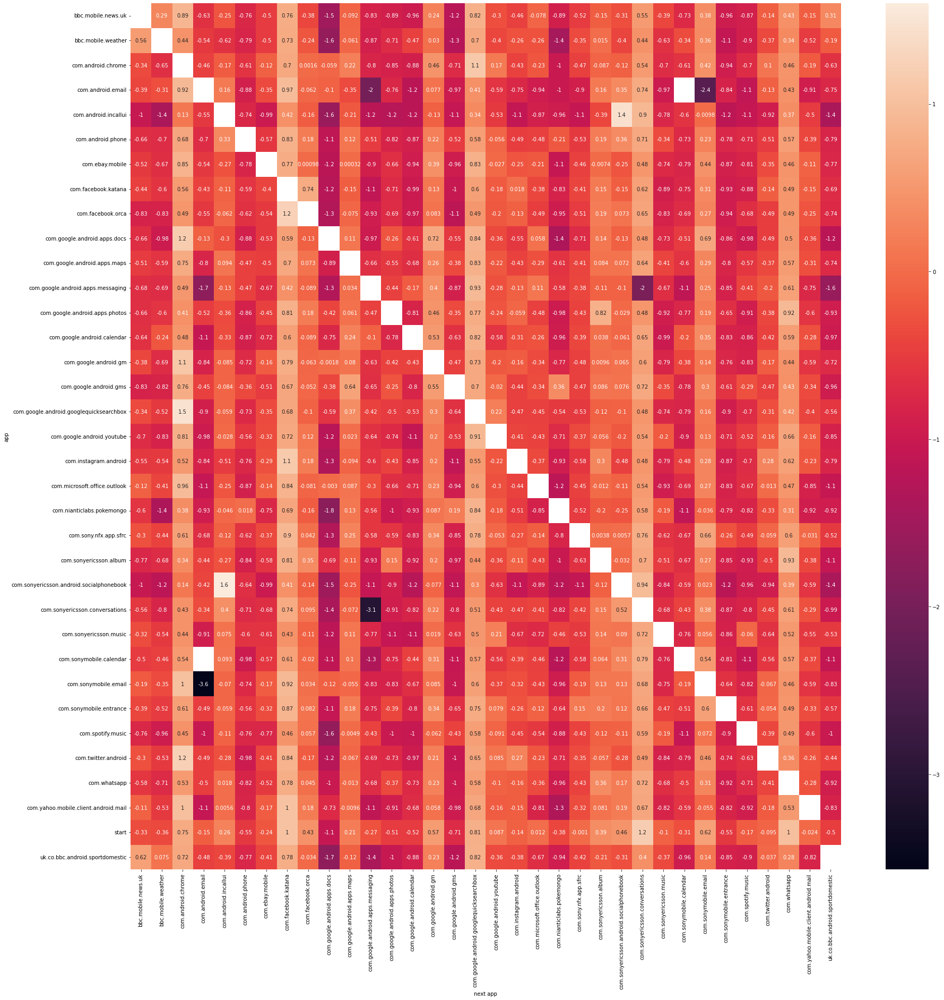

In [71]:
fig, ax = plt.subplots(figsize=(30,30))  
ax = sns.heatmap(np.log10(Transaction_matrix.replace(0, np.NaN)), annot=True)
ax.set(xlabel='next app')
ax.set(ylabel='app')
plt.savefig('output_80_100.png')
plt.show()

# Nums of frequent apps for each groups

In [66]:
frequent_app_groups = pd.DataFrame({'0-20': pd.Series(frequent_apps_0_20), '20-40': pd.Series(frequent_apps_20_40)\
                                    , '40-60': pd.Series(frequent_apps_40_60),'60-80': pd.Series(frequent_apps_60_80)\
                                   ,'80-100': pd.Series(frequent_apps_80_100)})

In [84]:
#data_canada = px.data.gapminder().query("country == 'Canada'")
fig = px.bar(frequent_app_groups.count(),color=frequent_app_groups.columns,title="Num of frequent apps for different group")
fig.show()

In [85]:
frequent_app_groups

,0-20,20-40,40-60,60-80,80-100
0,bbc.mobile.news.uk,bbc.mobile.news.uk,bbc.mobile.news.uk,bbc.mobile.news.uk,bbc.mobile.news.uk
1,com.amazon.mShop.android.shopping,com.amazon.mshop.android.shopping,bbc.mobile.weather,bbc.mobile.weather,bbc.mobile.weather
2,com.android.chrome,com.android.chrome,com.amazon.mshop.android.shopping,com.amazon.mshop.android.shopping,com.amazon.mshop.android.shopping
3,com.android.email,com.android.email,com.android.chrome,com.android.chrome,com.android.chrome
4,com.android.incallui,com.android.incallui,com.android.email,com.android.email,com.android.email
5,com.android.phone,com.android.phone,com.android.incallui,com.android.incallui,com.android.incallui
6,com.barclays.android.barclaysmobilebanking,com.ebay.mobile,com.android.phone,com.android.phone,com.android.phone
7,com.bskyb.sportnews,com.facebook.katana,com.ebay.mobile,com.ebay.mobile,com.ebay.mobile
8,com.ebay.mobile,com.facebook.orca,com.facebook.katana,com.facebook.katana,com.facebook.katana
9,com.facebook.katana,com.google.android.apps.docs,com.facebook.orca,com.facebook.orca,com.facebook.orca


In [87]:
print("Missing apps in second group:", (set(frequent_apps_0_20).difference(frequent_apps_20_40)))

Missing apps in second group: {'com.tumblr', 'com.bskyb.sportnews', 'com.barclays.android.barclaysmobilebanking', 'com.viber.voip', 'com.pof.android', 'com.amazon.mShop.android.shopping', 'kik.android', 'com.grindrapp.android'}


In [88]:
print("Missing apps in second group:", (set(frequent_apps_20_40).difference(frequent_apps_0_20)))

Missing apps in second group: {'com.amazon.mshop.android.shopping'}


# Compare the number of sessions of different length in 5 groups



* count number of sessions in each group


In [20]:
session_length_0_20 = data_0_20.groupby('session_length_x').size()/data_0_20.groupby(['user_id','session']).size().shape[0]

In [21]:
session_length_20_40 = data_20_40.groupby('session_length_x').size()/data_20_40.groupby(['user_id','session']).size().shape[0]

In [22]:
session_length_40_60 = data_40_60.groupby('session_length_x').size()/data_40_60.groupby(['user_id','session']).size().shape[0]

In [23]:
session_length_60_80 = data_60_80.groupby('session_length_x').size()/data_60_80.groupby(['user_id','session']).size().shape[0]

In [24]:
session_length_80_100 = data_80_100.groupby('session_length_x').size()/data_80_100.groupby(['user_id','session']).size().shape[0]

In [25]:
session_length_distribute = pd.DataFrame({'0-20': pd.Series(session_length_0_20), '20-40': pd.Series(session_length_20_40)\
                                    , '40-60': pd.Series(session_length_40_60),'60-80': pd.Series(session_length_60_80)\
                                   ,'80-100': pd.Series(session_length_80_100)})

In [30]:
session_length_distribute.shape[0] - session_length_distribute.dropna().shape[0]

198

In [31]:
session_length_distribute.shape[0]

259

In [33]:
fig = px.line(session_length_distribute, x=session_length_distribute.index, y=session_length_distribute.columns, markers=True)
fig.show()

Conclusions:
1. When length of session is smaller than 3, more sessions/app using activaties are found in group of users with longer sleep time 
2. When length of session is bigger than 3, more sessions/app using activaties are found in group of users with shorter sleep time
3. The over all trendency of using more apps in each session is droping as the size of session is increasing 
4. User group with longest sleep time is the only group who using more length 1 session app than other size of sessions, while the peak of the other groups all happened when size of session is two.
5. User group with the shortest sleep time has explicitly more longer sessions than others. 

In [36]:
fig = px.line(session_length_distribute.dropna(), x=session_length_distribute.dropna().index, y=session_length_distribute.columns, markers=True)
fig.show()

Above graph is the dropna version of the first graph 

Overall, it seems to be meaningful to groupby users with sessions length

# NMF for all 5 groups /transition matrix analyse

In [14]:
df_transaction_s0_20 = pd.read_csv('df_transaction_0_20.csv')
df_transaction_s20_40 = pd.read_csv('df_transaction_20_40.csv')
df_transaction_s40_60 = pd.read_csv('df_transaction_40_60.csv')
df_transaction_s60_80 = pd.read_csv('df_transaction_60_80.csv')
df_transaction_s80_100 = pd.read_csv('df_transaction_80_100.csv')


df_transaction_s0_20 = df_transaction_s0_20.drop('Unnamed: 0', 1)
df_transaction_s20_40 = df_transaction_s20_40.drop('Unnamed: 0', 1)
df_transaction_s40_60 = df_transaction_s40_60.drop('Unnamed: 0', 1)
df_transaction_s60_80 = df_transaction_s60_80.drop('Unnamed: 0', 1)
df_transaction_s80_100 = df_transaction_s80_100.drop('Unnamed: 0', 1)

df_transaction_s0_20=df_transaction_s0_20.rename(columns={'probability':'probability'})
df_transaction_s20_40=df_transaction_s20_40.rename(columns={'probability':'probability'})
df_transaction_s40_60=df_transaction_s40_60.rename(columns={'probability':'probability'})
df_transaction_s60_80=df_transaction_s60_80.rename(columns={'probability':'probability'})
df_transaction_s80_100=df_transaction_s80_100.rename(columns={'probability':'probability'})

t0=df_transaction_s0_20.set_index(['package_name','next_app'])
t1=df_transaction_s20_40.set_index(['package_name','next_app'])
t2=df_transaction_s40_60.set_index(['package_name','next_app'])
t3=df_transaction_s60_80.set_index(['package_name','next_app'])
t4=df_transaction_s80_100.set_index(['package_name','next_app'])

full_transition_matrix=pd.concat([t0,t1,t2,t3,t4],axis=1).reset_index().fillna(0)

<ipython-input-14-97a8add0cd03>:8: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df_transaction_s0_20 = df_transaction_s0_20.drop('Unnamed: 0', 1)
<ipython-input-14-97a8add0cd03>:9: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df_transaction_s20_40 = df_transaction_s20_40.drop('Unnamed: 0', 1)
<ipython-input-14-97a8add0cd03>:10: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df_transaction_s40_60 = df_transaction_s40_60.drop('Unnamed: 0', 1)
<ipython-input-14-97a8add0cd03>:11: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df_transaction_s60_80 = df_transaction_s60_80.drop('Unnamed: 0', 1)
<ipython-input-14-97a8add0cd03>:12: FutureWarning: In a 

0-20 group:46frequent apps  20-40group :39  40-60group:39  60-80 group: 38  80-100:38

In [15]:
df_transaction_s0_20['transition'] = df_transaction_s0_20["package_name"] +  ' - '+ df_transaction_s0_20["next_app"] 
df_transaction_s20_40['transition'] = df_transaction_s20_40["package_name"] +  ' - '+ df_transaction_s20_40["next_app"] 
df_transaction_s40_60['transition'] = df_transaction_s40_60["package_name"] +  ' - '+ df_transaction_s40_60["next_app"] 
df_transaction_s60_80['transition'] = df_transaction_s60_80["package_name"] +  ' - '+ df_transaction_s60_80["next_app"] 
df_transaction_s80_100['transition'] = df_transaction_s80_100["package_name"] +  ' - '+ df_transaction_s80_100["next_app"] 

In [16]:
df_transaction_s20_40_filtered =df_transaction_s20_40[df_transaction_s20_40.transition.isin(set(df_transaction_s0_20['transition']))]
df_transaction_s40_60_filtered =df_transaction_s40_60[df_transaction_s40_60.transition.isin(set(df_transaction_s0_20['transition']))]
df_transaction_s60_80_filtered =df_transaction_s60_80[df_transaction_s60_80.transition.isin(set(df_transaction_s0_20['transition']))]
df_transaction_s80_100_filtered =df_transaction_s80_100[df_transaction_s80_100.transition.isin(set(df_transaction_s0_20['transition']))]


In [17]:
df_transaction_s80_100_filtered = df_transaction_s80_100_filtered.sort_values(by=['transition'])
df_transaction_s60_80_filtered = df_transaction_s60_80_filtered.sort_values(by=['transition'])
df_transaction_s40_60_filtered = df_transaction_s40_60_filtered.sort_values(by=['transition'])
df_transaction_s20_40_filtered = df_transaction_s20_40_filtered.sort_values(by=['transition'])
df_transaction_s0_20 = df_transaction_s0_20.sort_values(by=['transition'])

In [18]:
df_transaction_s20_40_filtered

,package_name,next_app,probability,transition
0,bbc.mobile.news.uk,com.android.chrome,8.351325,bbc.mobile.news.uk - com.android.chrome
1,bbc.mobile.news.uk,com.android.email,0.087697,bbc.mobile.news.uk - com.android.email
2,bbc.mobile.news.uk,com.android.incallui,0.298312,bbc.mobile.news.uk - com.android.incallui
3,bbc.mobile.news.uk,com.android.phone,0.150389,bbc.mobile.news.uk - com.android.phone
4,bbc.mobile.news.uk,com.ebay.mobile,0.319092,bbc.mobile.news.uk - com.ebay.mobile
...,...,...,...,...
1253,uk.co.bbc.android.sportdomestic,com.spotify.music,0.344927,uk.co.bbc.android.sportdomestic - com.spotify.music
1254,uk.co.bbc.android.sportdomestic,com.tinder,0.521368,uk.co.bbc.android.sportdomestic - com.tinder
1255,uk.co.bbc.android.sportdomestic,com.twitter.android,2.866440,uk.co.bbc.android.sportdomestic - com.twitter.android
1256,uk.co.bbc.android.sportdomestic,com.whatsapp,6.622315,uk.co.bbc.android.sportdomestic - com.whatsapp


In [ ]:
    plt.figure(figsize=(300, 40), dpi=80)
    plt.plot(df_transaction_s0_20.transition,df_transaction_s0_20.probability,label='group of 0-20 percentile')
    plt.plot(df_transaction_s20_40_filtered.transition,df_transaction_s20_40_filtered.probability,label='group of 20-40 percentile')
    plt.plot(df_transaction_s40_60_filtered.transition,df_transaction_s40_60_filtered.probability,label='group of 40-60 percentile')
    plt.plot(df_transaction_s60_80_filtered.transition,df_transaction_s60_80_filtered.probability,label='group of 60-80 percentile')
    plt.plot(df_transaction_s80_100_filtered.transition,df_transaction_s80_100_filtered.probability,label='group of 80-100 percentile')

    plt.xticks(fontsize=16, rotation=90)
    plt.yticks(fontsize=35)
    plt.legend(fontsize=35) 
    plt.margins(x=0.001)

#plt.savefig("session length transion matrix analyse.pdf"，bbox_inches = "tight")
#,width=750, height=1000
plt.savefig("median sleeptime transion matrix analyse.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=1)

In [81]:
X=full_transition_matrix[['probability_g0','probability_g1','probability_g2','probability_g3','probability_g4']]

model = NMF(n_components=4, init='random', random_state=0)
W = model.fit_transform(X)
H = model.components_

In [82]:
W=pd.DataFrame(W)

In [83]:
pd.DataFrame(W[0].nlargest(50)).join(full_transition_matrix).rename(columns={0:'factor 0'})

,factor 0,package_name,next_app,probability_g0,probability_g1,probability_g2,probability_g3,probability_g4
1703,29.979682,com.spotify.music,end,0.000000,0.000000,0.000000,55.296093,0.000000
1532,27.960872,com.sonyericsson.music,end,0.000000,0.000000,0.000000,51.572494,0.000000
485,27.211851,com.facebook.katana,end,0.000000,0.000000,0.000000,50.190961,0.000000
1486,26.256238,com.sonyericsson.conversations,end,0.000000,0.000000,0.000000,48.428378,0.000000
1925,25.831397,com.whatsapp,end,0.000000,0.000000,0.000000,47.644779,0.000000
1169,25.722919,com.nianticlabs.pokemongo,end,0.000000,0.000000,0.000000,47.444697,0.000000
669,25.448949,com.google.android.apps.messaging,end,0.000000,0.000000,0.000000,46.939372,0.000000
81,24.516850,bbc.mobile.weather,end,0.000000,0.000000,0.000000,45.220161,0.000000
1578,24.074131,com.sonymobile.calendar,end,0.000000,0.000000,0.000000,44.403587,0.000000
1394,23.721020,com.sonyericsson.album,end,0.000000,0.000000,0.000000,43.752289,0.000000


# Transition matrix analysing based on the combination of all frequent apps 

In [78]:
 freuqent_apps = set(frequent_apps_0_20).union(set(frequent_apps_20_40),set(frequent_apps_40_60),set(frequent_apps_60_80),set(frequent_apps_80_100))

In [79]:

with open('frequent_apps_sleep_time.txt','wb') as f:
    pickle.dump(freuqent_apps, f)

##To read it again from file

In [4]:
with open('frequent_apps_sleep_time.txt','rb') as f:
    freuqent_apps = pickle.load(f)

## Create the full dataset

In [7]:
col_list1 = ["user_id", "package_name",'session','sleep_time_y']
data_0_20= pd.read_csv("data_0_20_quantile.csv", usecols=col_list1)

In [8]:
data_0_20['group']='group0_20'

In [10]:
col_list = ["user_id", "package_name",'session','sleep_time_y']
data_20_40 = pd.read_csv("data_20_40_quantile.csv", usecols=col_list)
data_20_40['group']='group20_40'

In [11]:
col_list = ["user_id", "package_name",'session','sleep_time_y']
data_40_60 = pd.read_csv("data_40_60_quantile.csv", usecols=col_list)
data_40_60['group']='group40_60'

In [12]:
col_list = ["user_id", "package_name",'session','sleep_time_y']
data_60_80 = pd.read_csv("data_60_80_quantile.csv", usecols=col_list)
data_60_80['group']='group60_80'

In [13]:
col_list = ["user_id", "package_name",'session','sleep_time_y']
data_80_100 = pd.read_csv("data_80_100_quantile.csv", usecols=col_list)
data_80_100['group']='group80_100'

In [14]:
full_data=pd.concat([data_0_20,data_20_40,data_40_60,data_60_80,data_80_100],axis=0)

In [16]:
full_data = full_data.rename(columns={'sleep_time_y': 'medium_sleep_time'})

In [17]:
full_data.to_csv('full_data_medium_sleep_time.csv',index=False)

In [18]:
full_data = pd.read_csv('full_data_medium_sleep_time.csv')

### Creating Matrix

In [19]:
full_data['start']=full_data.groupby('user_id').session.shift(1)!=full_data.session

full_data['end']=full_data.groupby('user_id').session.shift(-1)!=full_data.session

user_corpus_full_data=full_data.groupby(['user_id','session']).package_name.apply(' '.join)

user_corpus_with_start_end_full_data='start '+user_corpus_full_data+ ' end'

In [20]:
frequent_apps_without_start_end=set(freuqent_apps)
frequent_apps_without_start_end.remove("start")
frequent_apps_without_start_end.remove("end")

In [21]:
df_frequent_app_count = full_data[full_data.package_name.apply(lambda l : l in frequent_apps_without_start_end)].groupby(['group','package_name'])\
                            .agg({'session':'size'})\
                            .rename(columns={'session':'app_count'})

In [22]:
full_data['next_app'] = full_data.groupby(['group','user_id','session']).package_name.shift(-1).fillna("end")

In [23]:
df_next_app_count=full_data[full_data.package_name.isin(frequent_apps_without_start_end)].groupby(['group','package_name','next_app'])\
                            .agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'})

In [24]:
frequent_apps_without_start=set(freuqent_apps)
frequent_apps_without_start.remove("start")

In [25]:
individual_start_count=full_data.groupby(['group']).start.sum().reset_index()#,columns=['app_count'],index=['user_id','start'])
individual_start_count['package_name']='start'
individual_start_count=individual_start_count.rename(columns={'start':'app_count'})

In [26]:
df_numerator = df_next_app_count[df_next_app_count.index.get_level_values('next_app')\
                                 .isin(frequent_apps_without_start)].reset_index()

In [27]:
df_frequent_app_count=df_frequent_app_count.append(individual_start_count.set_index(['group','package_name']))
df_frequent_app_count=df_frequent_app_count.reset_index()

In [28]:
start_numerator=full_data[(full_data.start)&(full_data.package_name.isin(frequent_apps_without_start_end))].groupby(['group',"package_name"]).agg({'session':'size'})\
                            .rename(columns = {'session':'next_count'}).reset_index().rename(columns = {'package_name':'next_app'})
start_numerator['package_name']='start'


In [29]:
df_numerator=df_numerator.append(start_numerator)

df_frequent_app_count=df_frequent_app_count.rename(columns={'index':'package_name'})

df_transaction_s3 = df_numerator.merge(df_frequent_app_count, on=['group','package_name'])

df_transaction_s3['probability'] =df_transaction_s3.next_count/df_transaction_s3.app_count*100

df_transaction_s3.drop(['next_count', 'app_count'], axis=1, inplace=True)

In [30]:
df_transaction_s3.to_csv('full_data_sleeptime_fre_apps.csv',index='False')

In [31]:
df_transaction_s3

,group,package_name,next_app,probability
0,group0_20,bbc.mobile.news.uk,bbc.mobile.weather,1.000055
1,group0_20,bbc.mobile.news.uk,com.amazon.mShop.android.shopping,0.331910
2,group0_20,bbc.mobile.news.uk,com.android.chrome,8.994437
3,group0_20,bbc.mobile.news.uk,com.android.email,0.105254
4,group0_20,bbc.mobile.news.uk,com.android.incallui,0.253474
...,...,...,...,...
10688,group80_100,start,com.viber.voip,0.295941
10689,group80_100,start,com.whatsapp,10.185376
10690,group80_100,start,com.yahoo.mobile.client.android.mail,0.945259
10691,group80_100,start,kik.android,0.054320


### Visualization

In [32]:
df_transaction_s3 = pd.read_csv('full_data_sleeptime_fre_apps.csv')

In [33]:
df_transaction_s3=df_transaction_s3.drop('Unnamed: 0', 1)

<ipython-input-33-224d057aa6e1>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df_transaction_s3=df_transaction_s3.drop('Unnamed: 0', 1)


In [34]:
commoparable_transitions=df_transaction_s3.pivot(index=['package_name','next_app'],columns='group',values='probability')

In [35]:
df_transaction_s3_top=df_transaction_s3.nlargest(1000,'probability')

In [36]:
df_transaction_s3_top_index = df_transaction_s3_top.set_index(['package_name','next_app']).index

In [37]:
commoparable_transitions_top = commoparable_transitions.loc[df_transaction_s3_top_index]

In [38]:
new_cols=[('{}-> {}'.format(i[0], i[1]))for i in commoparable_transitions_top.index]

In [39]:
commoparable_transitions_top['transition']=new_cols

In [40]:
commoparable_transitions_top = commoparable_transitions_top.sort_values('transition')

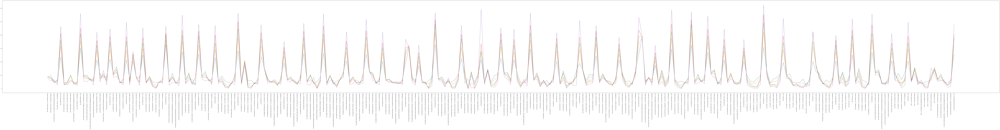

In [43]:
plt.figure(figsize=(210, 20), dpi=80)
plt.plot(commoparable_transitions_top.transition,commoparable_transitions_top.group0_20)
plt.plot(commoparable_transitions_top.transition,commoparable_transitions_top.group20_40)
plt.plot(commoparable_transitions_top.transition,commoparable_transitions_top.group40_60)
plt.plot(commoparable_transitions_top.transition,commoparable_transitions_top.group60_80)
plt.plot(commoparable_transitions_top.transition,commoparable_transitions_top.group80_100)
#plt.plot(['{} -> {}'.format(i[1], i[0]) for i in commoparable_transitions_top.index],commoparable_transitions_top.group2)
#plt.plot(['{} -> {}'.format(i[1], i[0]) for i in commoparable_transitions_top.index],commoparable_transitions_top.group3)
plt.xticks(rotation=90)
plt.savefig("medium_sleeptime_transition_matrix_analyse_union_fre_apps.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=1)